# Install Depedencies

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!pip install tensorflow
!pip install matplotlib
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from matplotlib import pyplot as plt
import cv2
import numpy as np
from matplotlib import pyplot as plt




Mounted at /content/drive


# Initiliaze Paths

In [ ]:
import os
import shutil
# Path to the dataset folder
dataset_path = '/content/drive/MyDrive/CV project/data/ham10000-skin-cancer/'

segmented_data_path = '/content/drive/My Drive/CV project/segmentedData'

# Example: List files in the dataset folder
# os.listdir(dataset_path)

# if os.path.exists(segmented_data_path):
#     # Remove the directory and its contents
#     shutil.rmtree(segmented_data_path)
#     print("Existing directory removed:", segmented_data_path)

# Create the directory
os.makedirs(segmented_data_path)
print("New directory created:", segmented_data_path)


FileExistsError: [Errno 17] File exists: '/content/drive/My Drive/CV project/segmentedData'

# Image Segmentation Using Contour

In [ ]:
def segment_image(image_path, save_folder):
    # Read the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    _, mask = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    white_mask = np.ones_like(image) * 255

    cv2.drawContours(white_mask, contours, -1, (0, 0, 0), -1)

    # segmented = cv2.drawContours(image.copy(), contours, -1, (255, 0, 0), 2)

    segmented = np.where(white_mask == np.array([0,0,0]), image, 255)

    save_path = os.path.join(save_folder, os.path.basename(image_path))

    plt.imsave(save_path, segmented.astype(np.uint8))

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Segmented Image')
    plt.imshow(segmented)
    plt.axis('off')

    plt.show()


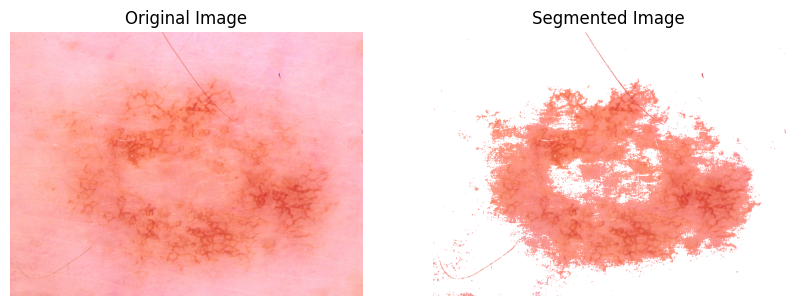

In [ ]:
# List all images and process them
original_images_folder = '/content/drive/MyDrive/CV project/data/ham10000-skin-cancer/HAM10000_images_part_1'
image_files = [os.path.join(original_images_folder, f) for f in os.listdir(original_images_folder) if f.endswith('.jpg')]
for image_path in image_files:
    segment_image(image_path, segmented_data_path)
    break


# Image Segmentation Using U-Net

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dropout

def unet(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # Contracting Path
    c1 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)

    # Bottleneck
    c5 = Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
    c5 = Dropout(0.3)(c5)
    c5 = Conv2D(1024, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    # Expansive Path
    u6 = UpSampling2D((2, 2))(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
    c6 = Dropout(0.2)(c6)
    c6 = Conv2D(512, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

    u7 = UpSampling2D((2, 2))(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

    u8 = UpSampling2D((2, 2))(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
    c8 = Dropout(0.1)(c8)
    c8 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

    u9 = UpSampling2D((2, 2))(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
    c9 = Dropout(0.1)(c9)
    c9 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

    # Output layer
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = Model(inputs=[inputs], outputs=[outputs])
    model.compile(optimizer=Adam(lr=1e-4), loss='binary_crossentropy', metrics=['accuracy'])
    return model



In [ ]:
# Instantiate the U-Net model
model = unet(input_size=(256, 256, 3))


In [ ]:
def load_and_preprocess_image(image_path, target_size=(256, 256)):
    """ Load an image, resize and normalize it for U-Net prediction. """
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_size)
    image = image / 255.0  # Normalize to [0, 1]
    return image

def post_process_mask(mask):
    """ Clean up and threshold the mask to binary form. """
    mask = mask.squeeze()  # Remove unnecessary dimensions
    mask = (mask > 0.69).astype(np.uint8)  # Thresholding
    return mask

# def create_segmented_image(image, mask):
#     # The lesion is represented by black (0) in the predicted mask
#     # Where the mask is 0, keep the original image; where the mask is 1, set to white
#     segmented_image = np.where(mask[..., None] == 0, image, 255)
#     return segmented_image.astype(np.uint8)

def create_segmented_image(image, mask):
    # Convert mask back to boolean
    mask_bool = mask.astype(bool)

    # Create a new copy of the image to be segmented
    segmented_image = np.copy(image)

    # Where the mask is False (background), set to white
    segmented_image[mask_bool] = [255, 255, 255]

    return segmented_image



1/1 [==============================] - 4s 4s/step


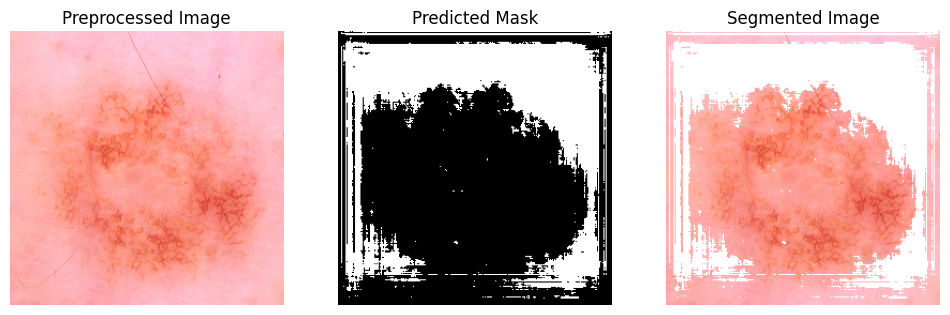

1/1 [==============================] - 2s 2s/step


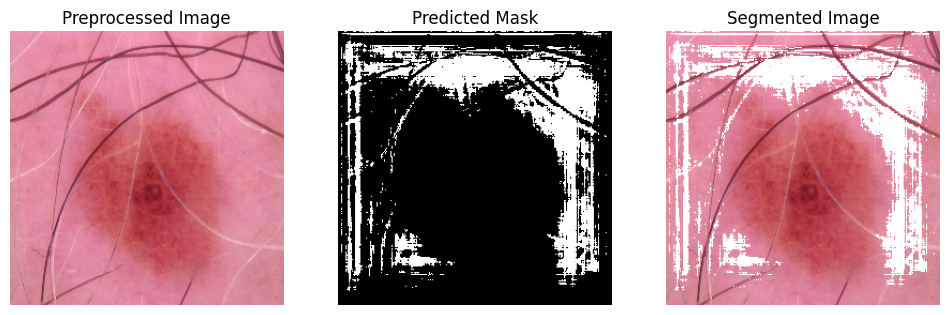

1/1 [==============================] - 2s 2s/step


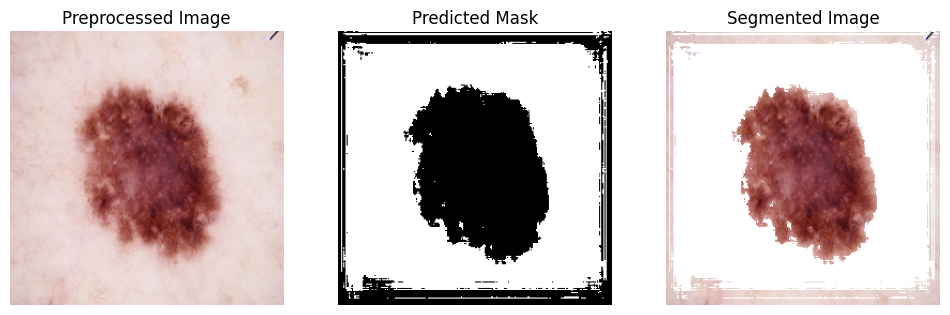

1/1 [==============================] - 2s 2s/step


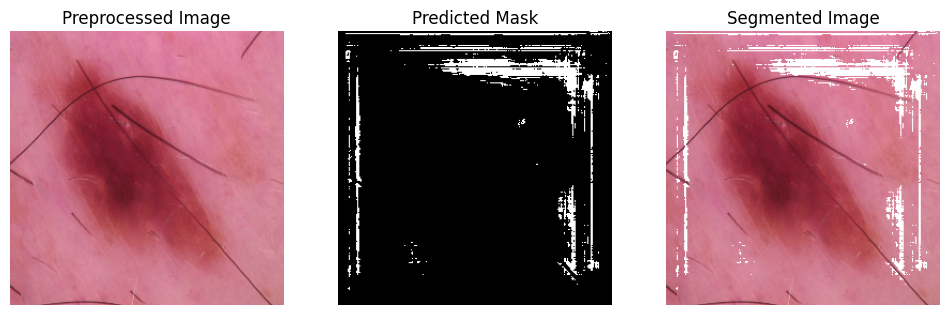

1/1 [==============================] - 2s 2s/step


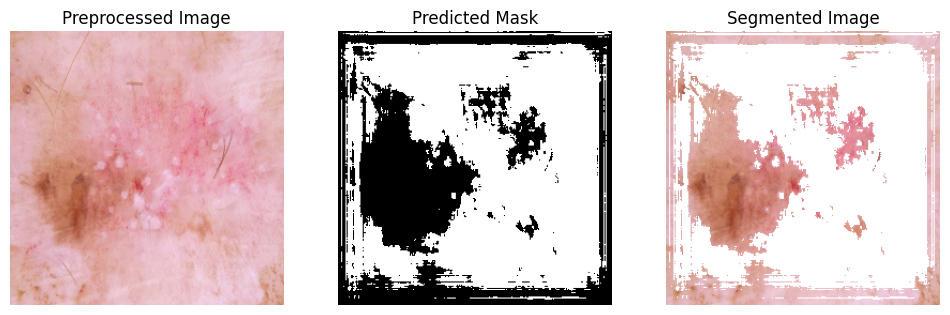

1/1 [==============================] - 2s 2s/step


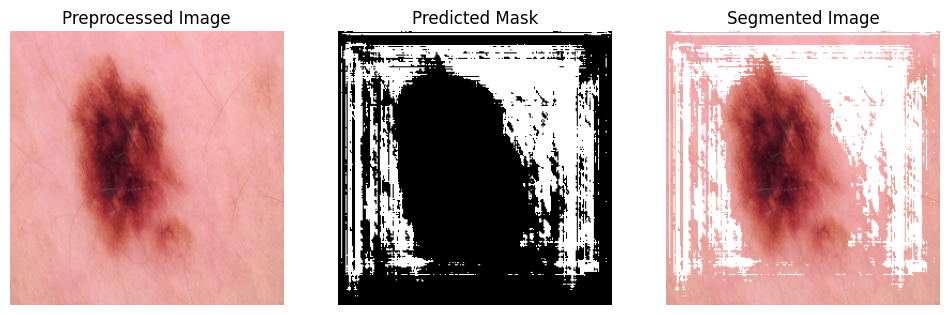

1/1 [==============================] - 3s 3s/step


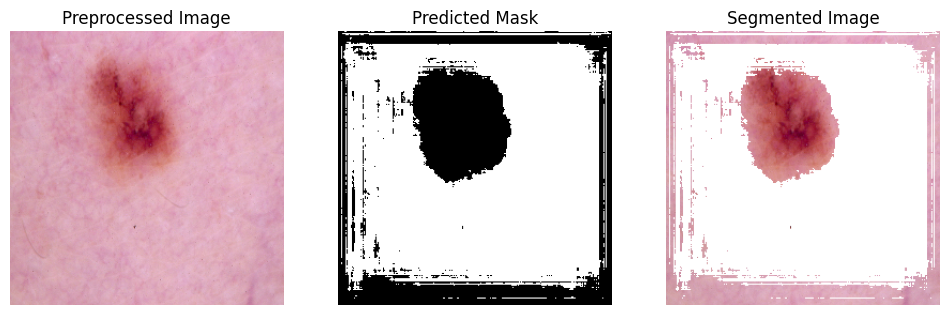

1/1 [==============================] - 2s 2s/step


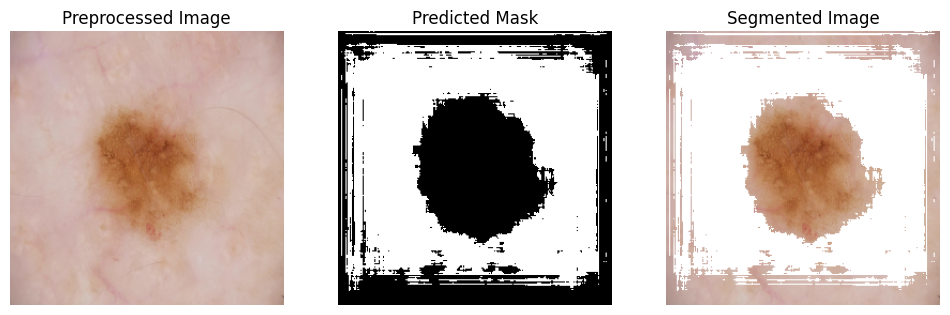

1/1 [==============================] - 2s 2s/step


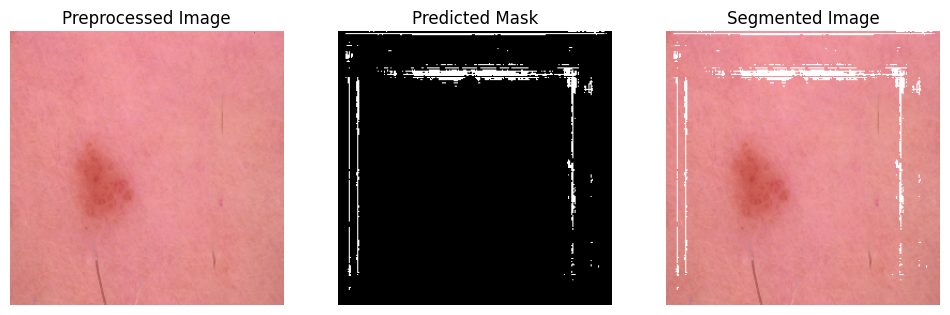

1/1 [==============================] - 2s 2s/step


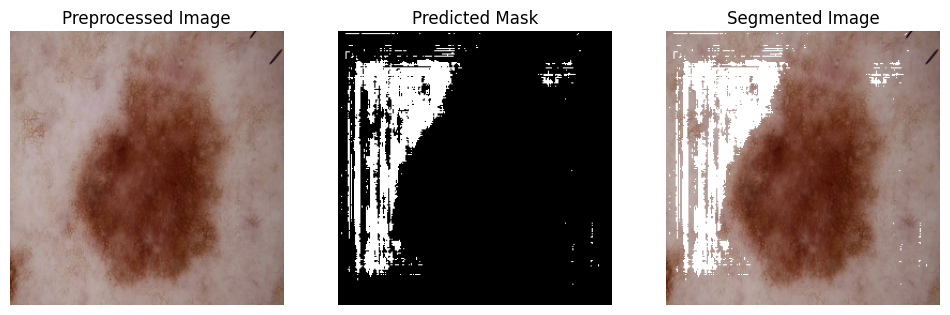

1/1 [==============================] - 2s 2s/step


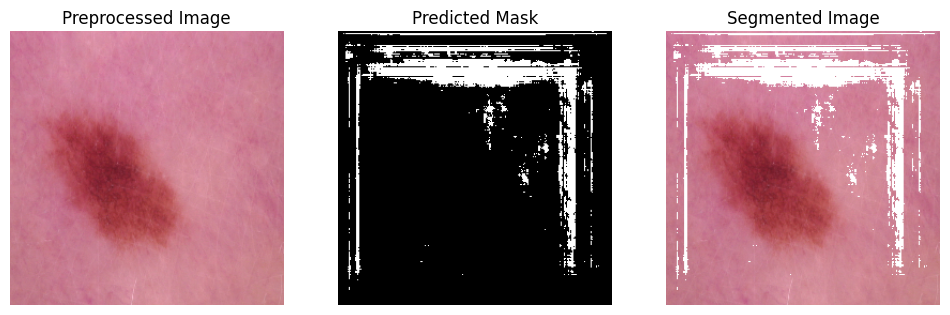

1/1 [==============================] - 3s 3s/step


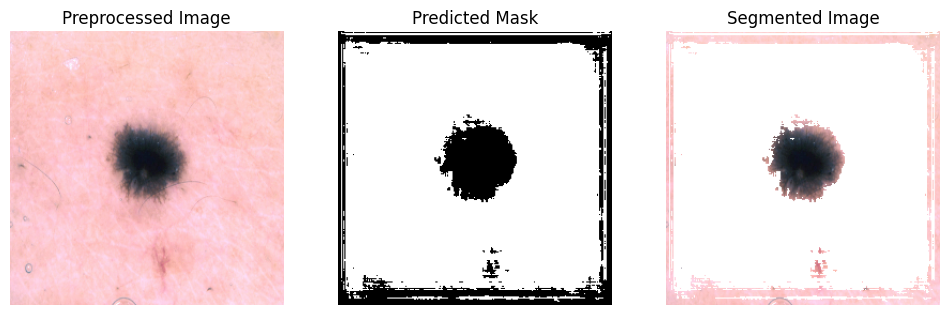

1/1 [==============================] - 2s 2s/step


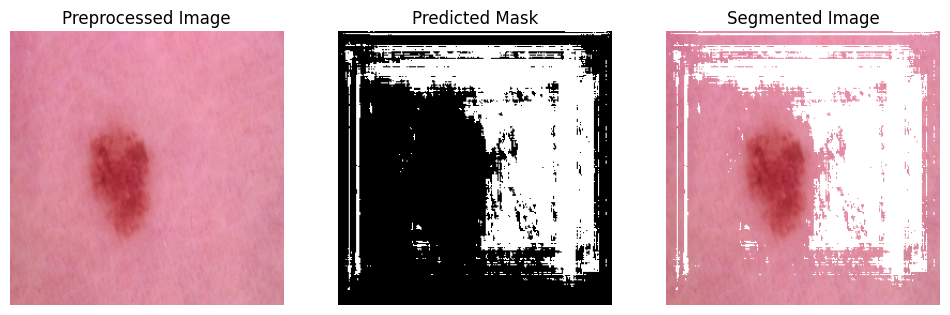

1/1 [==============================] - 2s 2s/step


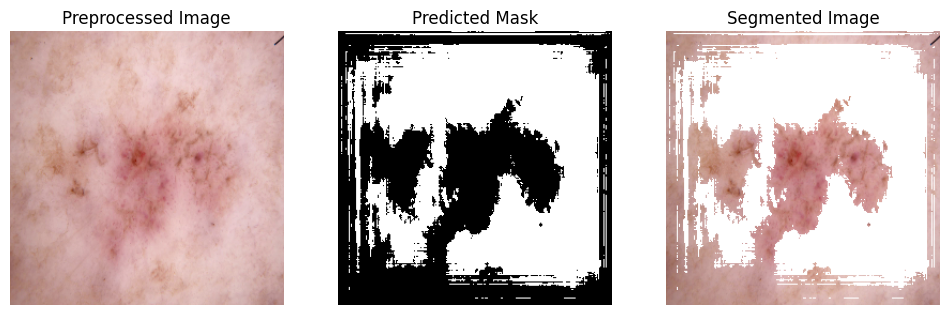

1/1 [==============================] - 2s 2s/step


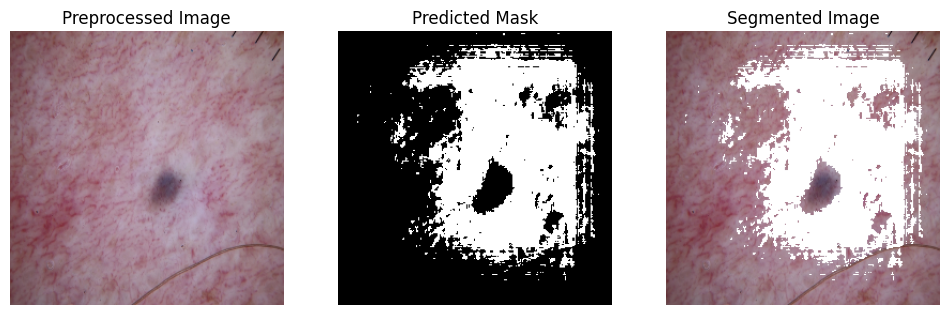

1/1 [==============================] - 2s 2s/step


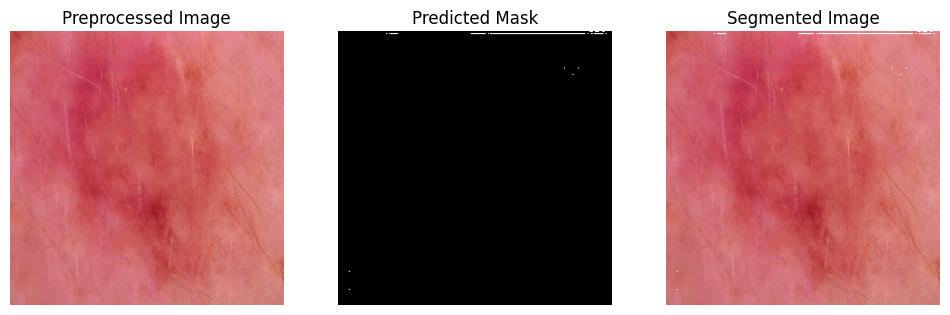

1/1 [==============================] - 3s 3s/step


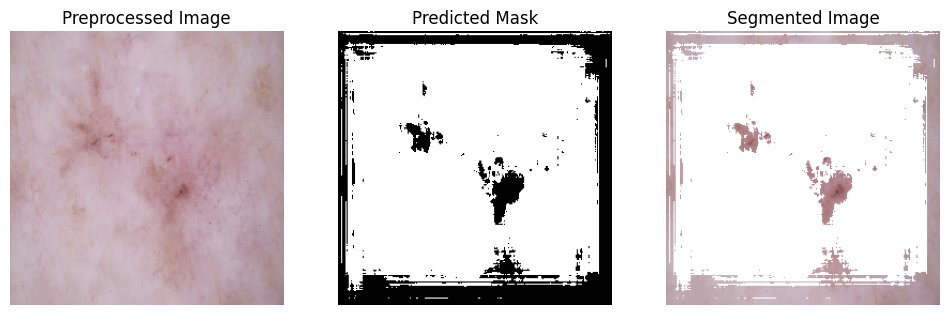

1/1 [==============================] - 2s 2s/step


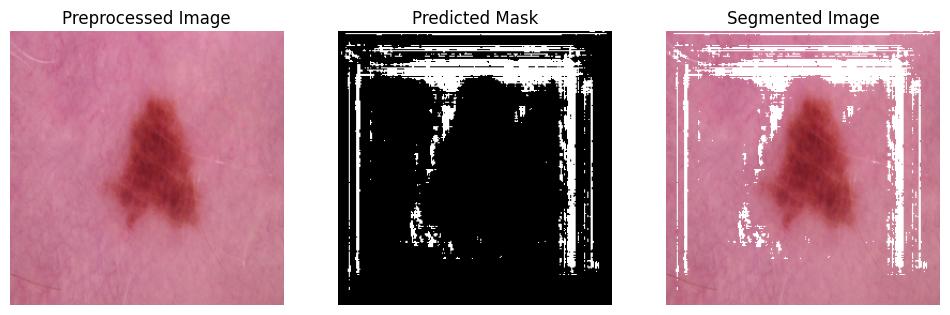

1/1 [==============================] - 2s 2s/step


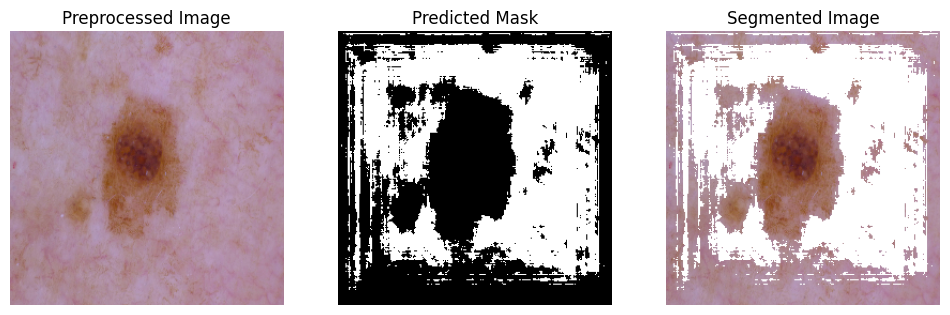

1/1 [==============================] - 2s 2s/step


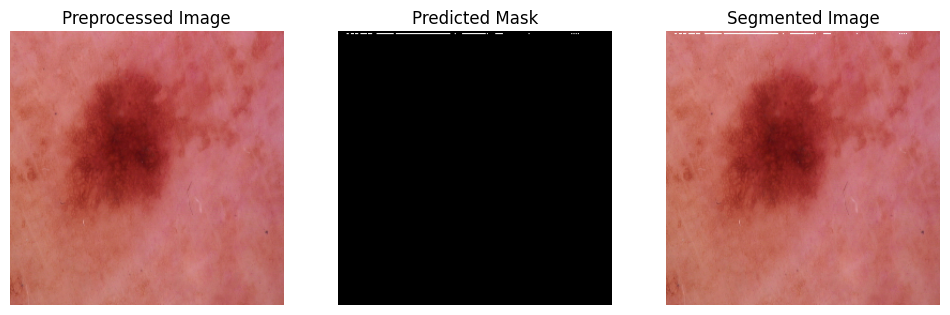

1/1 [==============================] - 2s 2s/step


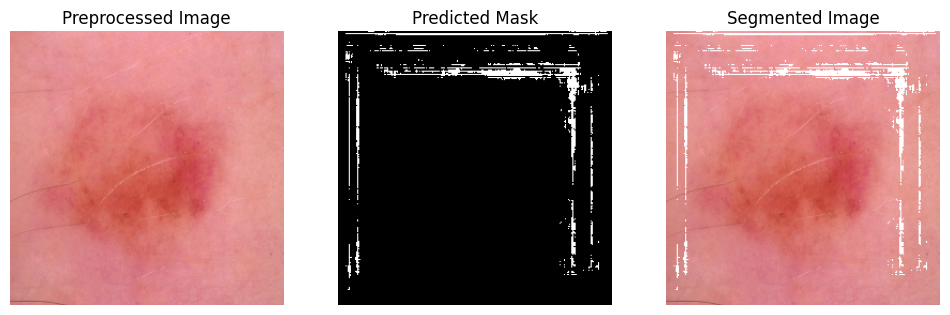

1/1 [==============================] - 2s 2s/step


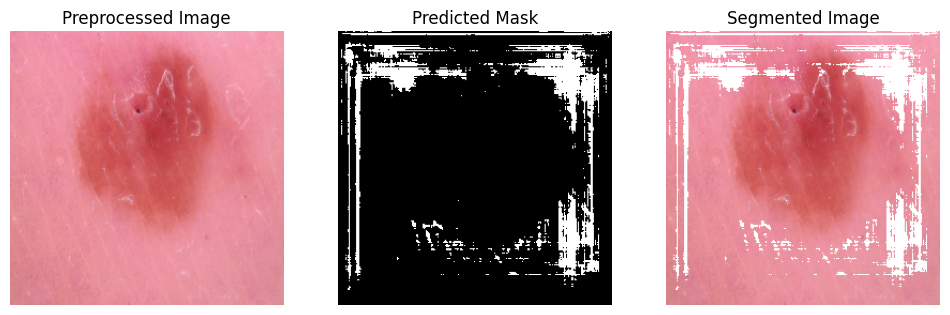

1/1 [==============================] - 3s 3s/step


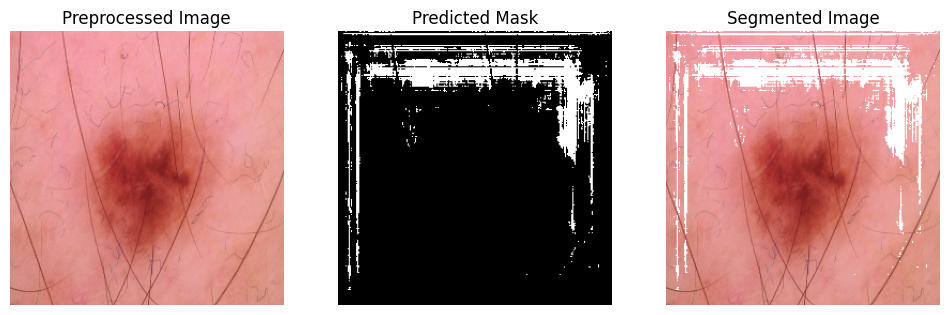

1/1 [==============================] - 2s 2s/step


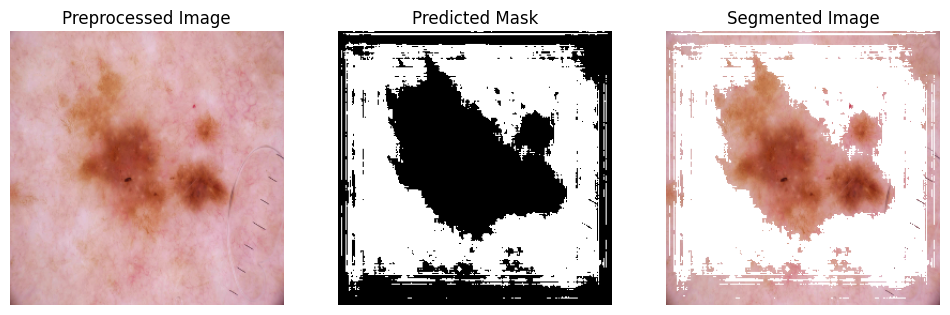

1/1 [==============================] - 2s 2s/step


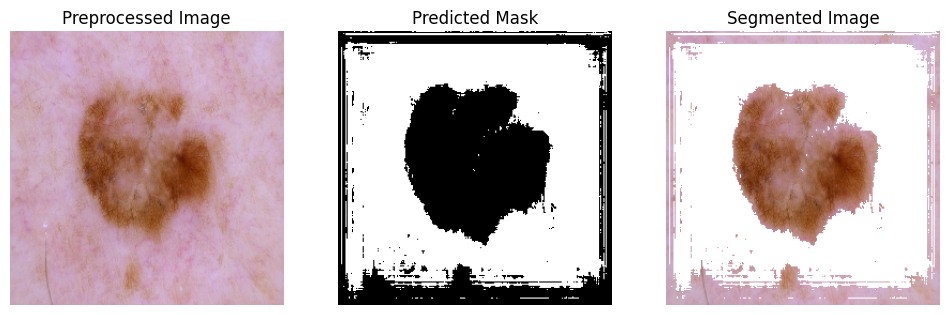

1/1 [==============================] - 2s 2s/step


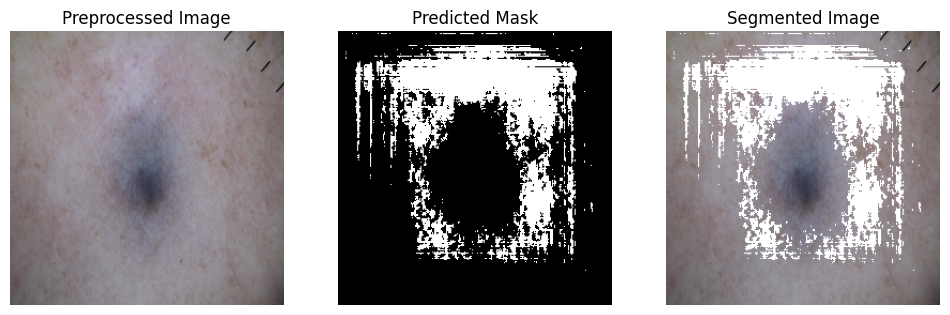

1/1 [==============================] - 2s 2s/step


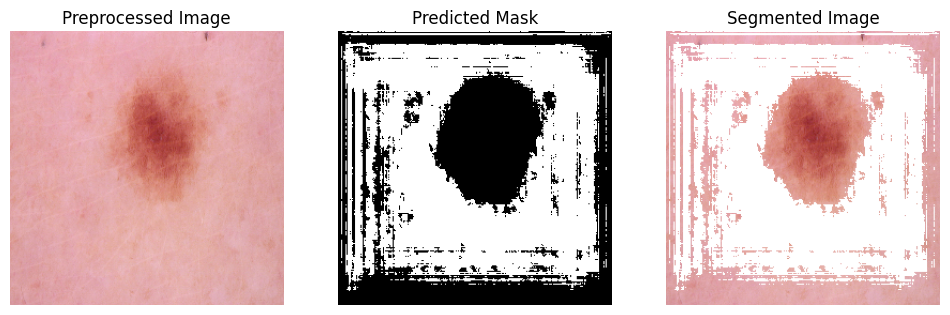

1/1 [==============================] - 3s 3s/step


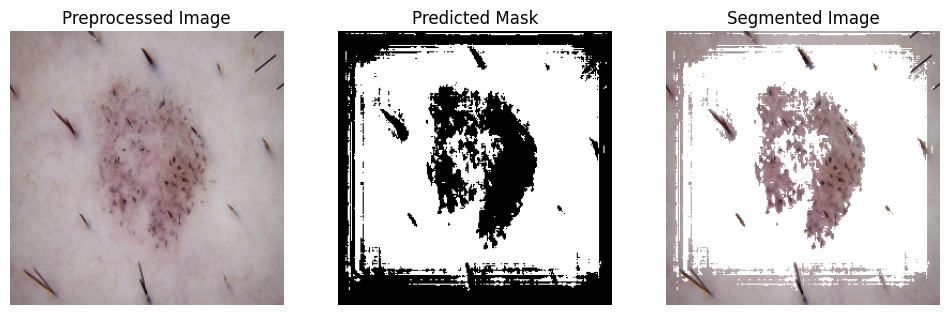

1/1 [==============================] - 2s 2s/step


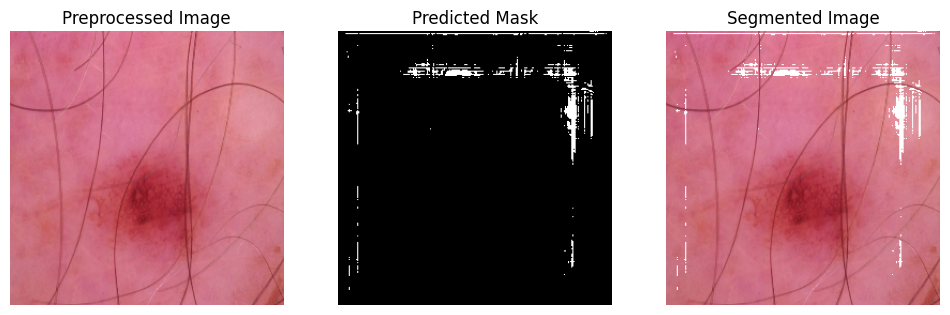

1/1 [==============================] - 2s 2s/step


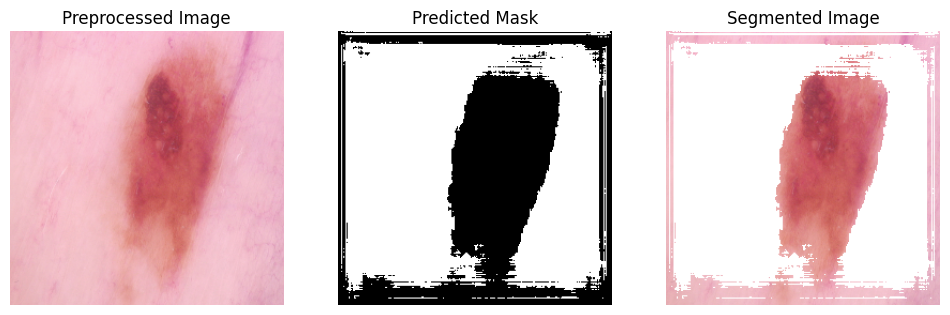

1/1 [==============================] - 2s 2s/step


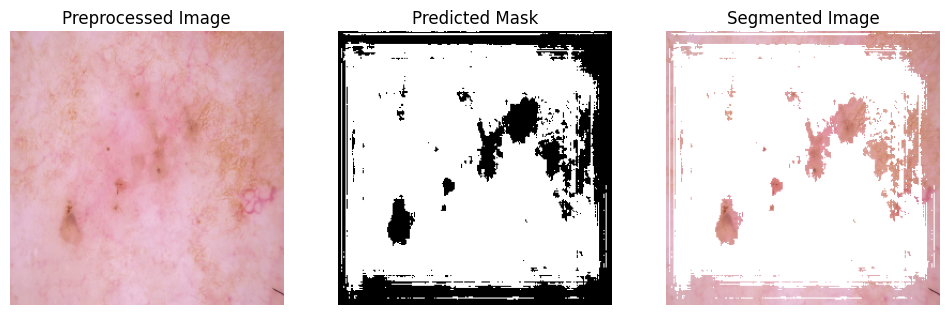

1/1 [==============================] - 2s 2s/step


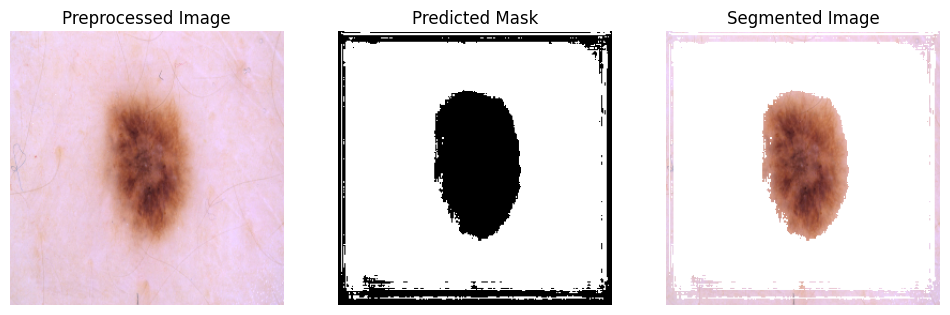

1/1 [==============================] - 2s 2s/step


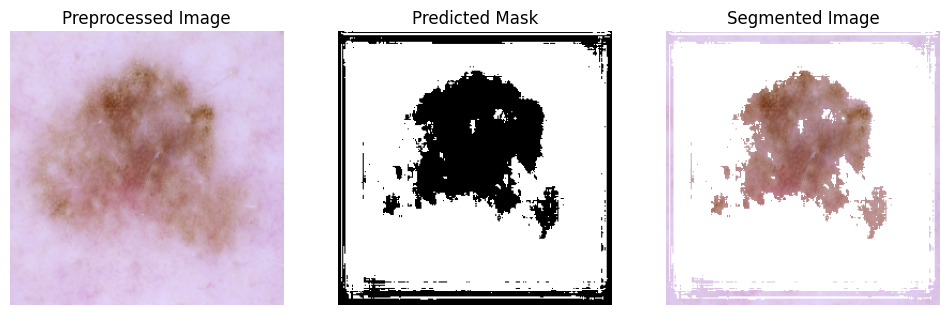

1/1 [==============================] - 3s 3s/step


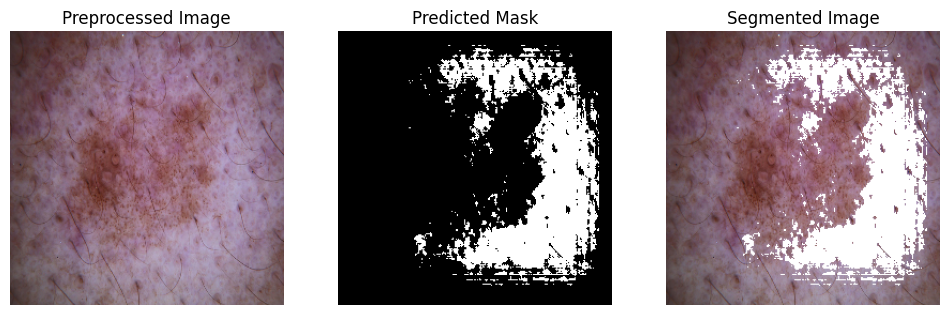

1/1 [==============================] - 2s 2s/step


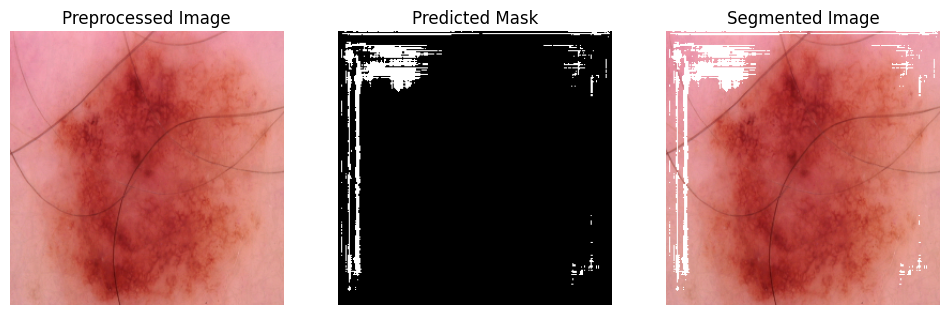

1/1 [==============================] - 2s 2s/step


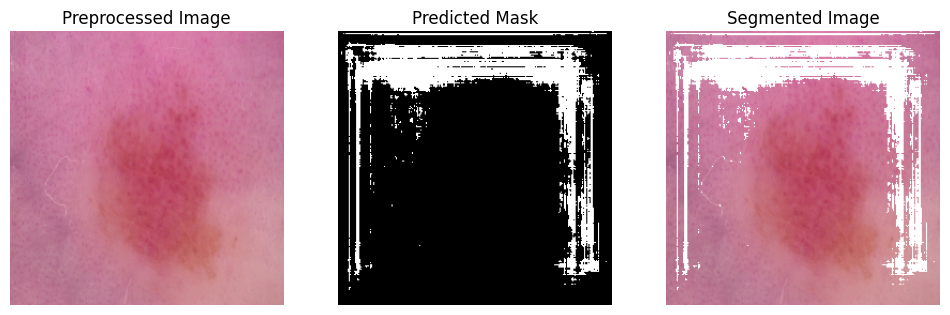

1/1 [==============================] - 2s 2s/step


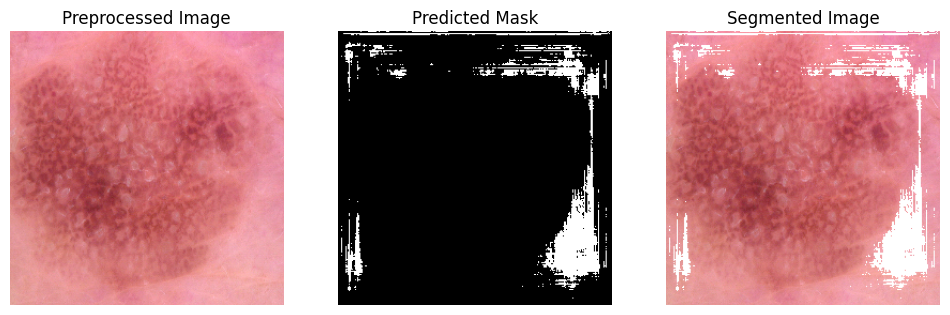

1/1 [==============================] - 2s 2s/step


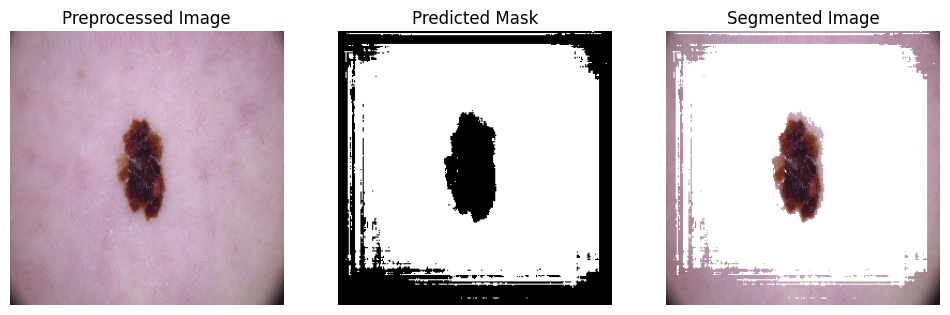

1/1 [==============================] - 3s 3s/step


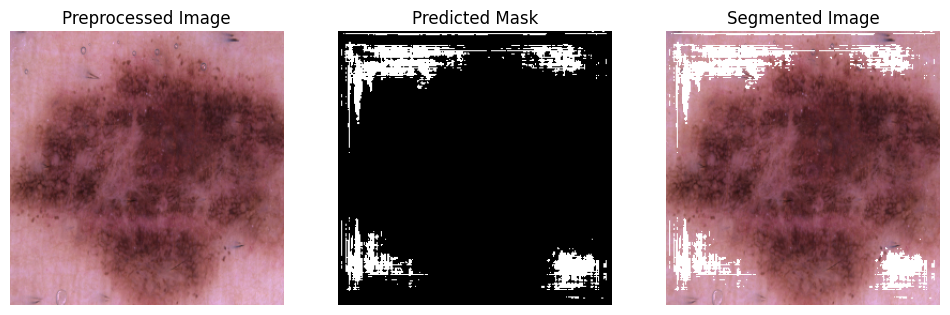

1/1 [==============================] - 2s 2s/step


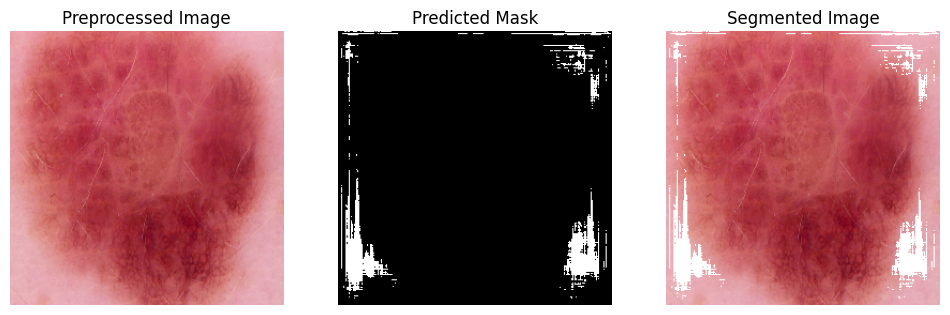

1/1 [==============================] - 2s 2s/step


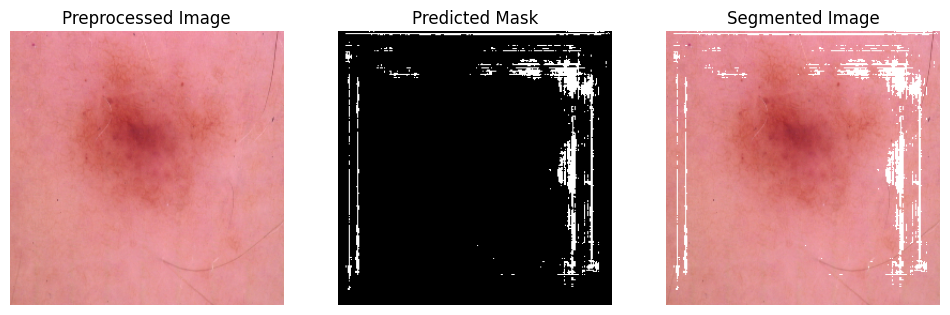

1/1 [==============================] - 2s 2s/step


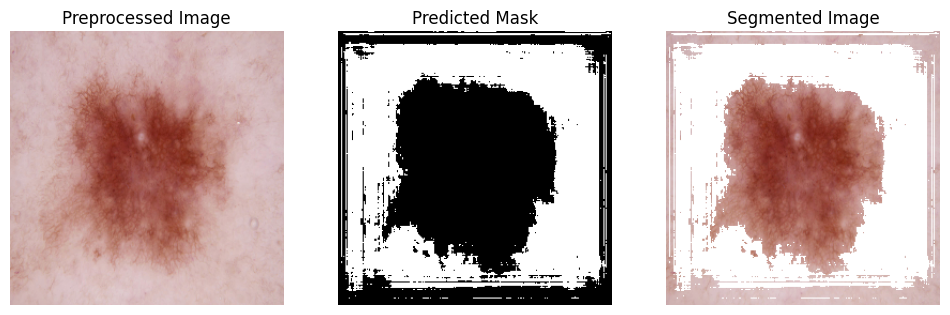

1/1 [==============================] - 2s 2s/step


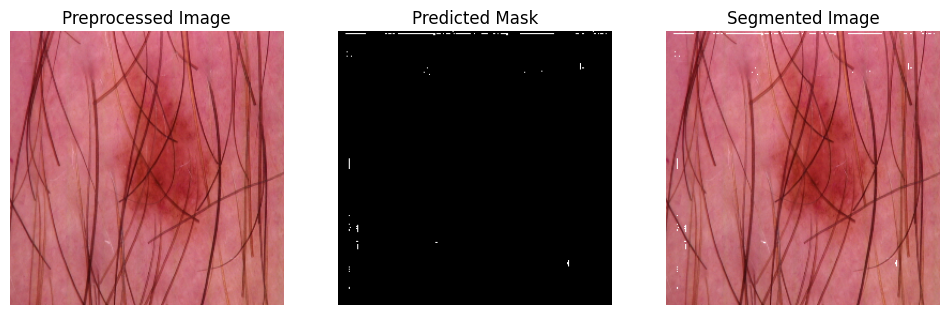

1/1 [==============================] - 3s 3s/step


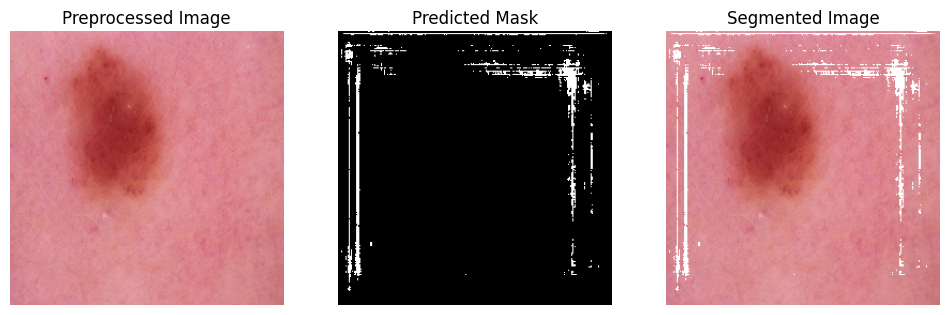

1/1 [==============================] - 3s 3s/step


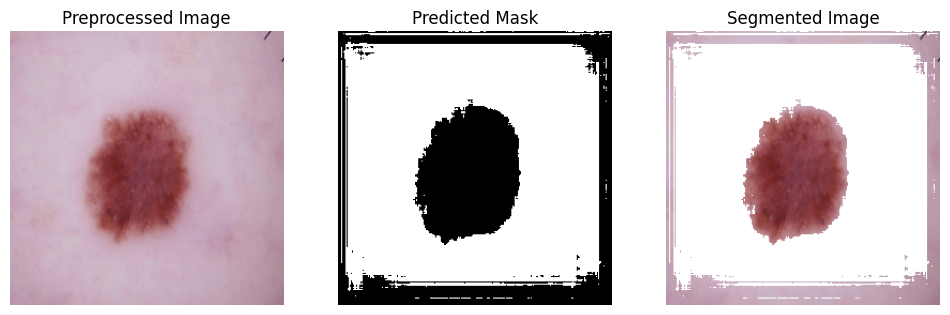

1/1 [==============================] - 2s 2s/step


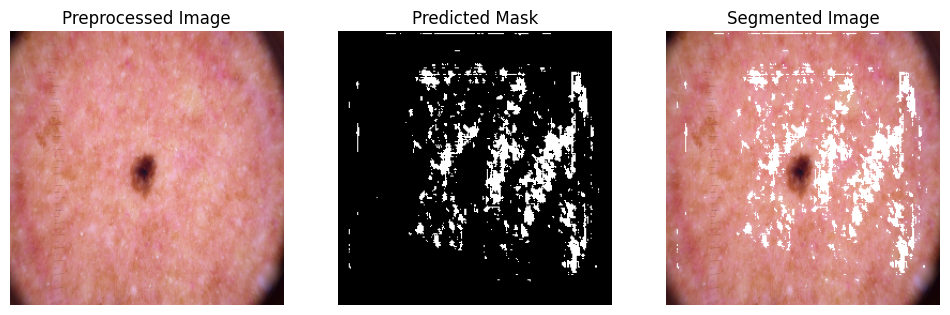

1/1 [==============================] - 2s 2s/step


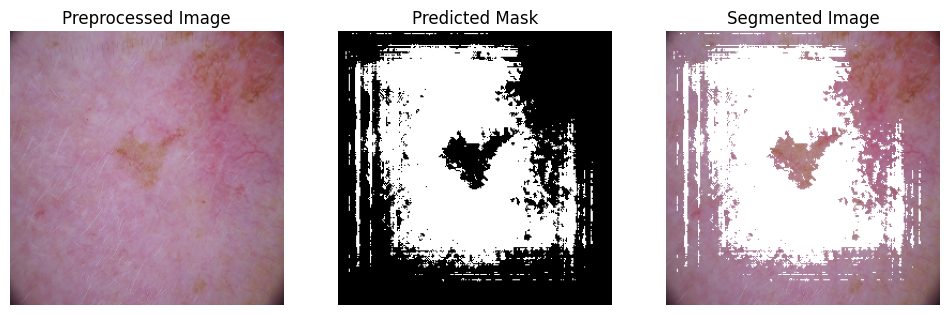

1/1 [==============================] - 2s 2s/step


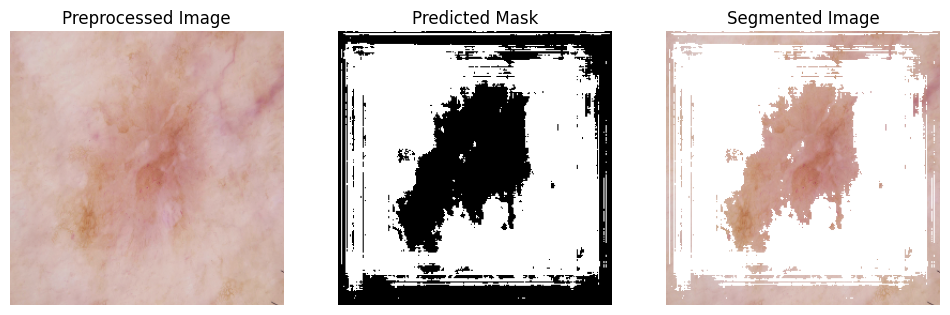

1/1 [==============================] - 2s 2s/step


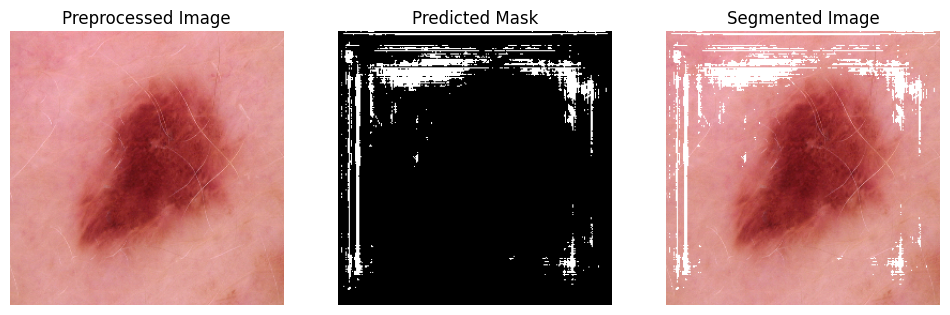

1/1 [==============================] - 3s 3s/step


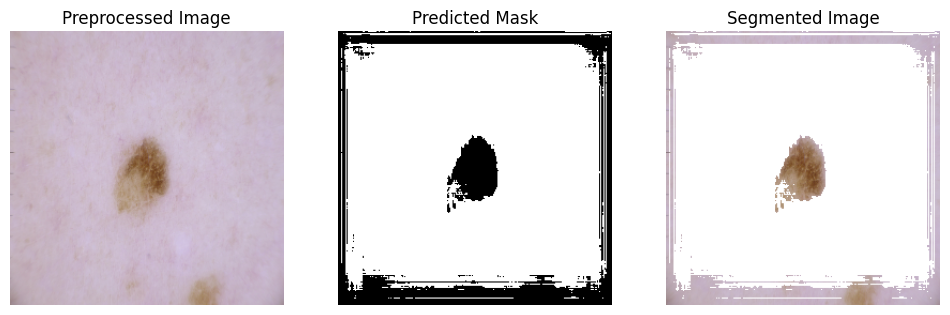

1/1 [==============================] - 2s 2s/step


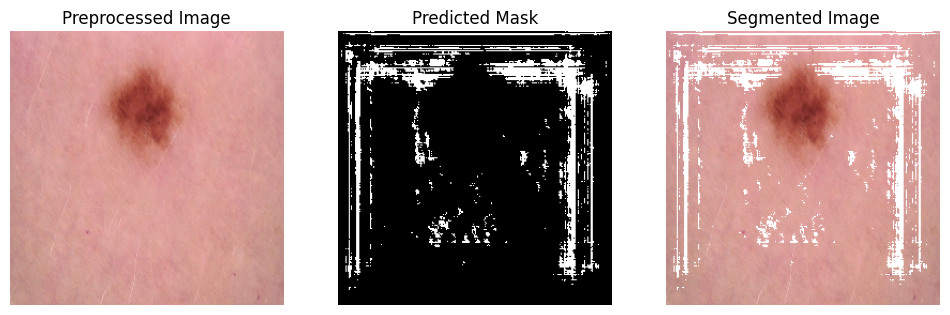

1/1 [==============================] - 2s 2s/step


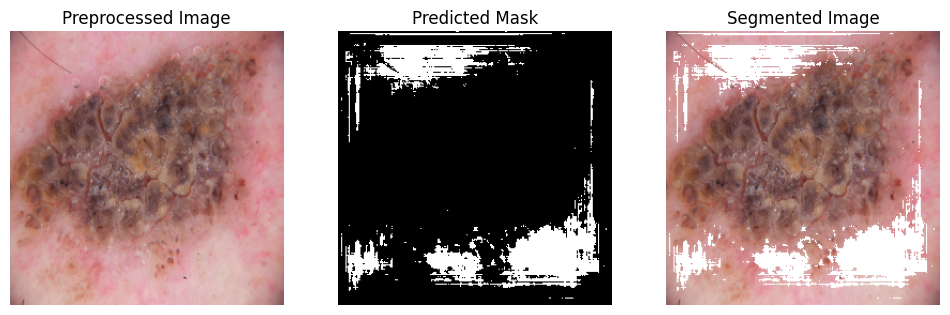

1/1 [==============================] - 2s 2s/step


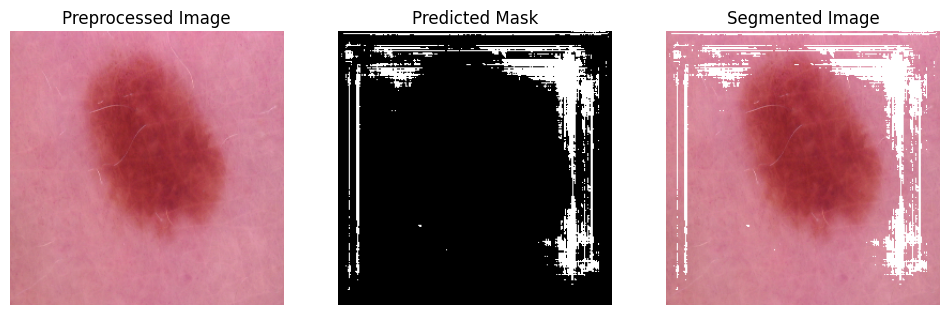

1/1 [==============================] - 2s 2s/step


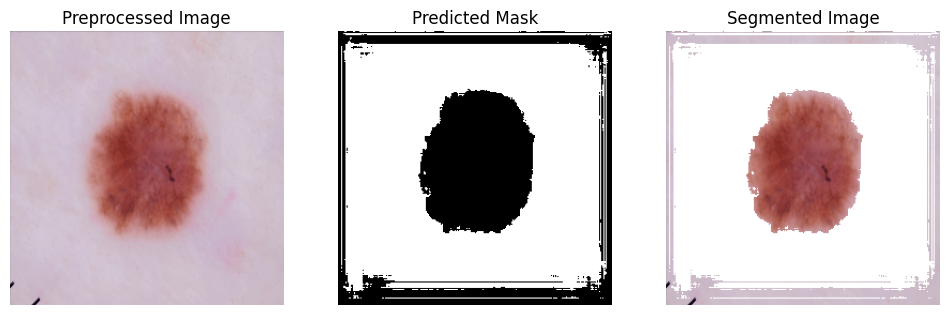

KeyboardInterrupt: 

In [ ]:
def process_images(folder_path, model, output_folder):
    for filename in os.listdir(folder_path):
        if filename.endswith('.jpg'):  # Filter for JPEG images
            image_path = os.path.join(folder_path, filename)
            image = load_and_preprocess_image(image_path)

            # Predict the mask
            mask = model.predict(np.expand_dims(image, axis=0))[0]  # Ensure correct dimensionality
            mask = post_process_mask(mask)

            # Apply the mask and create the segmented image
            segmented_image = create_segmented_image(image, mask)

            # Now display the images
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 3, 1)
            plt.title('Preprocessed Image')
            plt.imshow(image)
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.title('Predicted Mask')
            plt.imshow(mask, cmap='gray')
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.title('Segmented Image')
            plt.imshow(segmented_image)
            plt.axis('off')

            plt.show()
            # Save the segmented image, if necessary, using OpenCV or plt.imsave

            # If using plt.imsave, be careful not to override the color information.
            # Since the segmented image is in color, you should not use cmap='gray'.
            # plt.imsave(output_folder, segmented_image)

# Define the paths
image_folder = '/content/drive/MyDrive/CV project/data/ham10000-skin-cancer/HAM10000_images_part_1'
output_folder = '/content/drive/My Drive/CV project/segmentedData'

# Process the images
process_images(image_folder, model, output_folder)
